In [1]:
import pandas as pd
import geopandas as gpd
import geoplot as gplt
import matplotlib as plt
import geoplot.crs as gcrs
plt.rcParams.update({'figure.max_open_warning': 0})

In [2]:
national_fips_codes = pd.read_csv('covid_scraper/data/state_fips_codes_2017.csv', dtype=str)
national_fips_codes = national_fips_codes[national_fips_codes['State (FIPS)'] != '00']
national_fips_codes = national_fips_codes.rename(columns={'State (FIPS)': 'st_fips', 'Name': 'st_name'}).drop(columns=['Region', 'Division'])
national_fips_codes

,st_fips,st_name
2,09,Connecticut
3,23,Maine
4,25,Massachusetts
5,33,New Hampshire
6,44,Rhode Island
7,50,Vermont
9,34,New Jersey
10,36,New York
11,42,Pennsylvania
14,17,Illinois


In [3]:
hotspots_recent = pd.read_csv('covid_scraper/exports/midwest_emerging_counties.csv', dtype={'state_fips': 'object', 'fips': 'object'})
hotspots_recent.head()

,date,state_fips,fips,state,county,cases,deaths,pop_2019,cases_p_100k,deaths_p_100k,latitude,longitude,cases_daily_pct_change,deaths_daily_pct_change,cases_weekly_pct_change,deaths_weekly_pct_change,date_only,map,abbrev
0,2020-04-10,19,19179,Iowa,Wapello,3,0,34969.0,8.6,0.0,41.0313,-92.4095,0.5,NaN,0.484975,NaN,2020-04-10,![](https://static.startribune.com/news/projec...,IA
1,2020-03-28,19,19179,Iowa,Wapello,1,0,34969.0,2.9,0.0,41.0313,-92.4095,0.0,NaN,0.484975,NaN,2020-03-28,![](https://static.startribune.com/news/projec...,IA
2,2020-04-04,19,19179,Iowa,Wapello,1,0,34969.0,2.9,0.0,41.0313,-92.4095,0.0,NaN,0.484975,NaN,2020-04-04,![](https://static.startribune.com/news/projec...,IA
3,2020-04-03,19,19179,Iowa,Wapello,1,0,34969.0,2.9,0.0,41.0313,-92.4095,0.0,NaN,0.484975,NaN,2020-04-03,![](https://static.startribune.com/news/projec...,IA
4,2020-04-02,19,19179,Iowa,Wapello,1,0,34969.0,2.9,0.0,41.0313,-92.4095,0.0,NaN,0.484975,NaN,2020-04-02,![](https://static.startribune.com/news/projec...,IA


In [4]:
hotspot_states = hotspots_recent[['state_fips', 'state']].drop_duplicates()
hotspot_states

,state_fips,state
0,19,Iowa
45,27,Minnesota
83,31,Nebraska
174,18,Indiana
313,17,Illinois
655,55,Wisconsin
765,46,South Dakota
1205,26,Michigan
4253,38,North Dakota


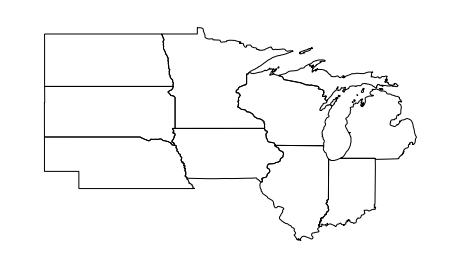

In [5]:
# contiguous_usa = gpd.read_file(gplt.datasets.get_path('contiguous_usa'))
# gplt.polyplot(contiguous_usa)
state_shorelines = gpd.read_file("/Users/Coreymj/Documents/GIS/natural_earth/ne_10m_admin_1_states_provinces_lakes/ne_10m_admin_1_states_provinces_lakes.shp")
state_shorelines = state_shorelines[(state_shorelines['iso_a2'] == 'US') & (state_shorelines['name'].isin(hotspot_states['state']))]
# state_shorelines.crs
# state_shorelines = state_shorelines.to_crs("EPSG:26915")
# state_shorelines.crs
gplt.polyplot(state_shorelines)

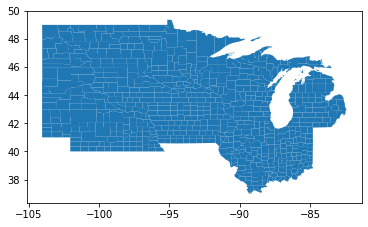

In [6]:
# counties = gpd.read_file("/Users/Coreymj/Documents/GIS/usa/tl_2019_us_county/tl_2019_us_county.shp")
counties = gpd.read_file("/Users/Coreymj/Documents/GIS/usa/USA County Shorelines/usa_county_shorelines_update.shp", dtype={'FIPS': str})
counties['FIPS'] = counties['FIPS'].astype(str)
counties['FIPS'] = counties['FIPS'].str.pad(width=5, side='left', fillchar='0')
# counties.dtypes
# counties['full_fips'] = counties.STATEFP + counties.COUNTYFP
counties['st_fips'] = counties['FIPS'].str[0:2]
counties['cty_fips'] = counties['FIPS'].str[2:]
counties.dtypes
counties = counties.rename(columns={'FIPS': 'full_fips', 'NAME': 'cty_name'})
counties = counties.merge(national_fips_codes,
                         how="left",
                         on="st_fips")
# counties
# counties[~counties['st_name'].isnull()].to_file("covid_scraper/data/shp/usa_county_shorelines/usa_county_shorelines.shp")

hotspot_state_counties = counties[counties['st_fips'].isin(hotspot_states.state_fips)]
hotspot_state_counties
hotspot_state_counties.plot()


In [7]:
state_srids = {
    'Minnesota': 26992, # 26915,
    'Iowa': 26915,
    'Wisconsin': 3071, # 26916,
    'Illinois': 26916,
    'Michigan': 26916,
    'Indiana': 26916,
    'North Dakota': 26914,
    'South Dakota': 26914,
    'Nebraska': 26914,
}

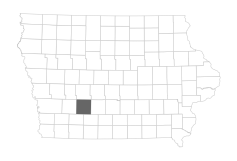

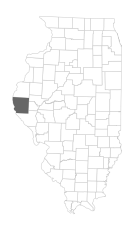

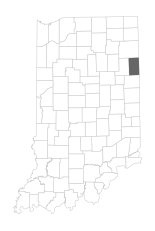

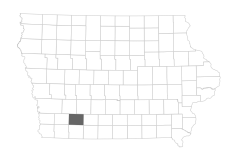

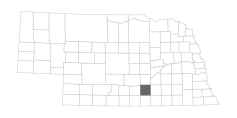

...

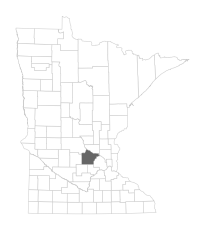

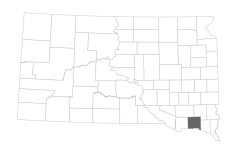

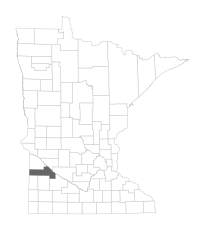

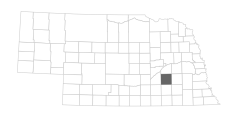

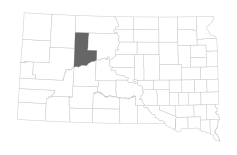

In [8]:
# for c in hotspots_recent[['state_fips', 'fips', 'state', 'county']].drop_duplicates().iterrows():
for c in hotspot_state_counties.iterrows():  # All counties in those states, might as well
    proj = 'EPSG:{}'.format(state_srids[c[1]['st_name']])
    all_county_shp = hotspot_state_counties[hotspot_state_counties['st_fips'] == c[1]['st_fips']].to_crs(proj)
    county_shp = all_county_shp[all_county_shp['full_fips'] == c[1]['full_fips']]  
#     county_shp = all_county_shp[all_county_shp['FIPS'] == c[1]['fips']]                                               
#     state_shp = state_shorelines[state_shorelines['name'] == c[1]['state']].to_crs(proj)
    
#     base = state_shp.plot(color='white', edgecolor='black')
    base = all_county_shp.plot(color='white', edgecolor='#CCCCCC', linewidth=0.5, figsize=(4, 4))
    outmap = county_shp.plot(ax=base, color='#666666')
    outmap.axis('off')
    outmap.figure.savefig(
        'covid_scraper/exports/locator_maps/county_{}.png'.format(c[1]['full_fips']),
        bbox_inches='tight',
        pad_inches=0,
        transparent=True
    )
    